## Import Required Libraries

In [101]:
# ignore future warning and deprecation messages
import warnings
from numba.core.errors import NumbaDeprecationWarning

# warnings.simplefilter(action='ignore', category=NumbaDeprecationWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)

In [102]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from tensorflow.keras import models

import shap
from lime import lime_tabular

## Load the models and data

In [103]:
rnn_model = models.load_model('rnn_model.keras')
lstm_model = models.load_model('lstm_model.keras')
gru_model = models.load_model('gru_model.keras')

In [104]:
X_train = pickle.load(open('X_train.pickle', 'rb'))
X_test = pickle.load(open('X_test.pickle', 'rb'))

In [105]:
veggies = pickle.load(open('col_names.pickle', 'rb'))

## LIME Explainer of the models

In [106]:
lime_explainer = lime_tabular.RecurrentTabularExplainer(training_data=X_train, 
                                    mode='regression', feature_names=veggies)

### exploring for $5^{th}$ instance of test data

#### a) RNN Model

In [107]:
rnn_lime_explained = lime_explainer.explain_instance(data_row=X_test[4], classifier_fn=rnn_model.predict,
                                                   num_features=5)
rnn_lime_explained.show_in_notebook()

#### b) LSTM Model

In [108]:
lstm_lime_explained = lime_explainer.explain_instance(data_row=X_test[4], classifier_fn=lstm_model.predict,
                                                   num_features=5)
lstm_lime_explained.show_in_notebook()

#### c) GRU Model

In [109]:
gru_lime_explained = lime_explainer.explain_instance(data_row=X_test[4], classifier_fn=gru_model.predict,
                                                   num_features=5)
gru_lime_explained.show_in_notebook()

### exploring for $10^{th}$ instance of test data

#### a) RNN Model

In [110]:
rnn_lime_explained = lime_explainer.explain_instance(data_row=X_test[9], classifier_fn=rnn_model.predict,
                                                   num_features=5)
rnn_lime_explained.show_in_notebook()

#### b) LSTM Model

In [111]:
lstm_lime_explained = lime_explainer.explain_instance(data_row=X_test[9], classifier_fn=lstm_model.predict,
                                                   num_features=5)
lstm_lime_explained.show_in_notebook()

#### c) GRU Model

In [112]:
gru_lime_explained = lime_explainer.explain_instance(data_row=X_test[9], classifier_fn=gru_model.predict,
                                                   num_features=5)
gru_lime_explained.show_in_notebook()

### exploring for $15^{th}$ instance of test data

#### a) RNN Model

In [113]:
rnn_lime_explained = lime_explainer.explain_instance(data_row=X_test[14], classifier_fn=rnn_model.predict,
                                                   num_features=5)
rnn_lime_explained.show_in_notebook()

#### b) LSTM Model

In [114]:
lstm_lime_explained = lime_explainer.explain_instance(data_row=X_test[14], classifier_fn=lstm_model.predict,
                                                   num_features=5)
lstm_lime_explained.show_in_notebook()

#### c) GRU Model

In [115]:
gru_lime_explained = lime_explainer.explain_instance(data_row=X_test[14], classifier_fn=gru_model.predict,
                                                   num_features=5)
gru_lime_explained.show_in_notebook()

## SHAP Explainer of the model

In [116]:
shap.initjs()

### a) RNN Model

In [117]:
rnn_explainer = shap.DeepExplainer(rnn_model, data=X_train)
rnn_shap_values = rnn_explainer.shap_values(X_test)

In [118]:
rnn_shap_values_step0 = rnn_shap_values[0]
rnn_shap_values_s0 = np.array(rnn_shap_values_step0)

In [119]:
i = 0
j = 0
x_test_df = pd.DataFrame(data=X_test[i][j].reshape(1,9), columns = veggies)
shap.force_plot(rnn_explainer.expected_value[0], rnn_shap_values_s0[i][j], x_test_df)

In [120]:
i = 4

x_test_df = pd.DataFrame(data=X_test[i], columns = veggies)
shap.force_plot(rnn_explainer.expected_value[0], rnn_shap_values_s0[i], x_test_df)

In [123]:
rnn_shap_values_2D = rnn_shap_values_s0.reshape(-1,9)
X_test_2D = X_test.reshape(-1,9)

x_test_2d = pd.DataFrame(data=X_test_2D, columns = veggies)

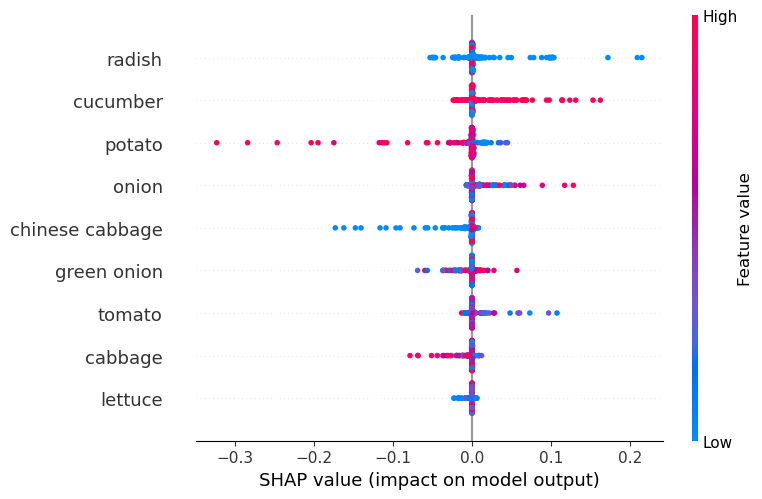

In [124]:
shap.summary_plot(rnn_shap_values_2D, x_test_2d)

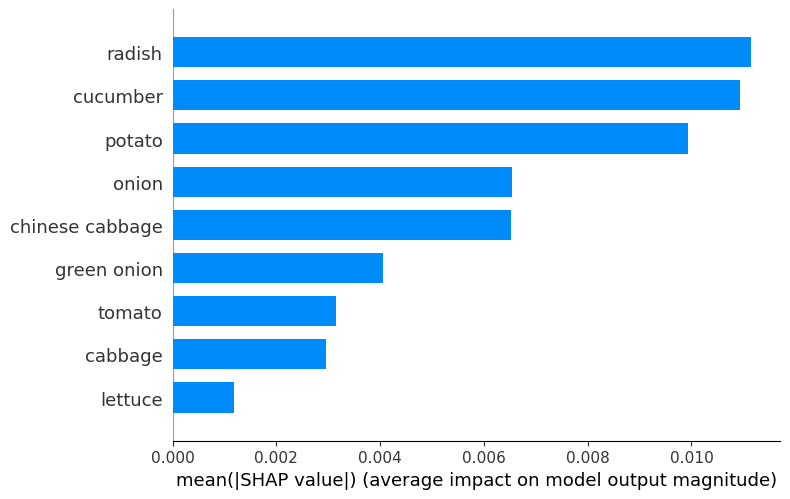

In [125]:
shap.summary_plot(rnn_shap_values_2D, x_test_2d, plot_type="bar")

### b) LSTM Model

In [126]:
lstm_explainer = shap.DeepExplainer(lstm_model, data=X_train)
lstm_shap_values = lstm_explainer.shap_values(X_test)

In [127]:
lstm_shap_values_step0 = lstm_shap_values[0]
lstm_shap_values_s0 = np.array(lstm_shap_values_step0)

In [128]:
i = 0
j = 0
x_test_df = pd.DataFrame(data=X_test[i][j].reshape(1,9), columns = veggies)
shap.force_plot(lstm_explainer.expected_value[0], lstm_shap_values_s0[i][j], x_test_df)

In [129]:
i = 4

x_test_df = pd.DataFrame(data=X_test[i], columns = veggies)
shap.force_plot(lstm_explainer.expected_value[0], lstm_shap_values_s0[i], x_test_df)

In [130]:
lstm_shap_values_2D = lstm_shap_values_s0.reshape(-1,9)

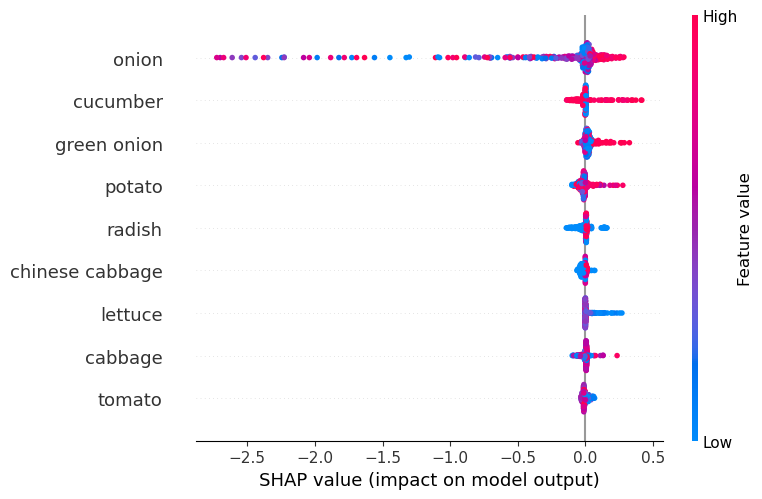

In [131]:
shap.summary_plot(lstm_shap_values_2D, x_test_2d)

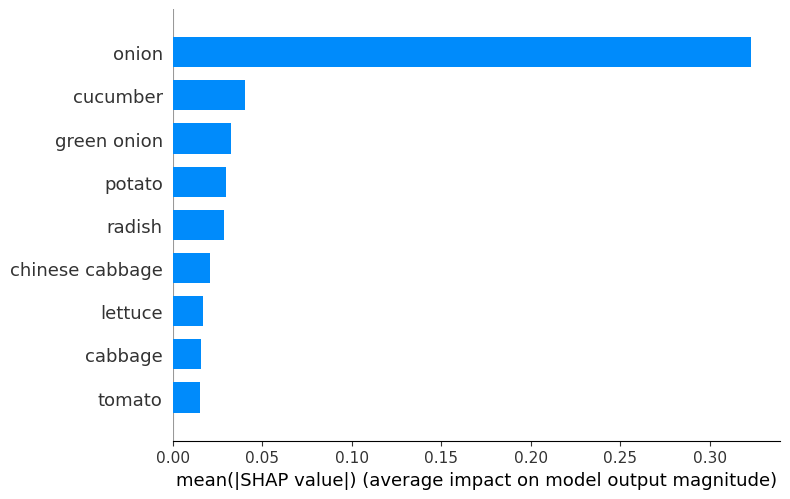

In [132]:
shap.summary_plot(lstm_shap_values_2D, x_test_2d, plot_type="bar")

### c) GRU Model

In [133]:
gru_explainer = shap.DeepExplainer(gru_model, data=X_train)
gru_shap_values = gru_explainer.shap_values(X_test)

In [134]:
gru_shap_values_step0 = gru_shap_values[0]
gru_shap_values_s0 = np.array(gru_shap_values_step0)

In [135]:
i = 0
j = 0
x_test_df = pd.DataFrame(data=X_test[i][j].reshape(1,9), columns = veggies)
shap.force_plot(gru_explainer.expected_value[0], gru_shap_values_s0[i][j], x_test_df)

In [136]:
i = 4

x_test_df = pd.DataFrame(data=X_test[i], columns = veggies)
shap.force_plot(gru_explainer.expected_value[0], gru_shap_values_s0[i], x_test_df)

In [137]:
gru_shap_values_2D = gru_shap_values_s0.reshape(-1,9)

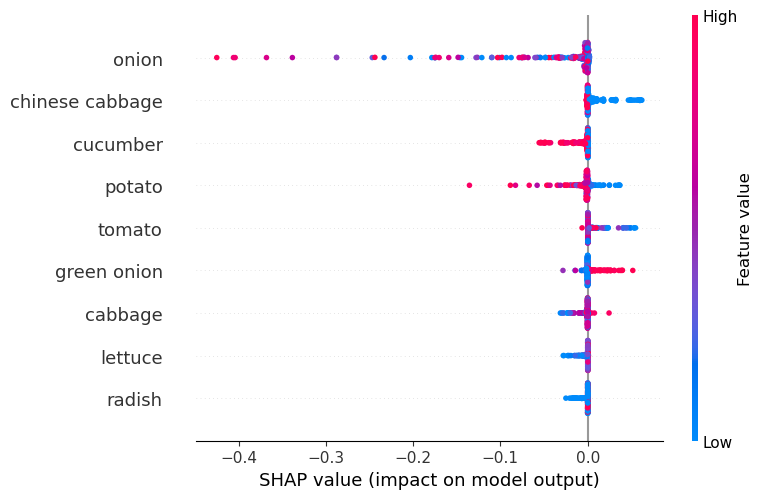

In [138]:
shap.summary_plot(gru_shap_values_2D, x_test_2d)

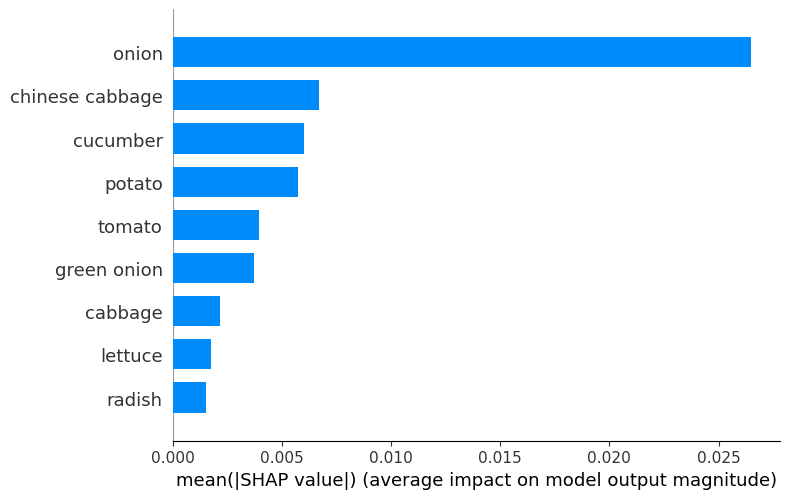

In [139]:
shap.summary_plot(gru_shap_values_2D, x_test_2d, plot_type="bar")